# Branching Out into Isolation Forests

### Tree Based Anomaly Detection

Stephanie Kirmer

ChiPy October 2020

In [1]:
import numpy as np
import pandas as pd
import logging as log
import os
import datetime
import typing
from typing import Callable, List
import re
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from bokeh.plotting import figure, output_notebook, show, output_file
from bokeh.models import ColorBar, ColumnDataSource
from bokeh.palettes import Spectral6, brewer
from bokeh.transform import linear_cmap, factor_cmap

from plotnine import *
import plotnine.options as pn

import matplotlib.pyplot as plt
from sklearn import tree
import graphviz

import shap
import plotly.express as px

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D

# Load data 

From Kaggle - tracks on Spotify

https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=data.csv

Let's identify really unusual tracks!

In [2]:
dataset = pd.read_csv("/Users/skirmer/projects/isolationforests/data/data.csv")

In [3]:
dataset.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.995,['Carl Woitschach'],0.708,158648,0.1950,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928,0.0506,118.469,0.7790,1928
1,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928,0.0462,83.972,0.0767,1928
2,0.604,['Seweryn Goszczyński'],0.749,104300,0.2200,0,6L63VW0PibdM1HDSBoqnoM,0.000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,1928,0.9290,107.177,0.8800,1928
3,0.995,['Francisco Canaro'],0.781,180760,0.1300,0,6M94FkXd15sOAOQYRnWPN8,0.887,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,1928-09-25,0.0926,108.003,0.7200,1928
4,0.990,"['Frédéric Chopin', 'Vladimir Horowitz']",0.210,687733,0.2040,0,6N6tiFZ9vLTSOIxkj8qKrd,0.908,11,0.0980,-16.829,1,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,1928,0.0424,62.149,0.0693,1928


Characteristics of the tracks:

In [4]:
dataset.columns

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year'],
      dtype='object')

# Feature Engineering


In [5]:
dataset['year_bin'] = pd.cut(dataset['year'],9)

In [6]:

pn.figure_size = (7,3)
# Must downsample to get any reasonable rendering speed
plotset = dataset.sample(frac=0.15, replace=False, random_state=1)

plotset.shape

(25486, 20)

In [7]:
features = ['acousticness', 'explicit', 'duration_ms','instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity',
            'speechiness', 'tempo', 'year']


# Model Training

In [8]:

def fit_model(dataframe, feature_list):
    ''' Accepts dataframe and list of features to be used in model training. 
    Returns trained model object and dataset with NAs removed and anomalousness 
    features appended. '''
    rng = np.random.RandomState(42)
    nd = dataframe.dropna()
    #nd = dataframe.fillna(value=0)
    X_train2 = nd.loc[:,feature_list]
    clf = IsolationForest(n_estimators=200, max_features=3,
                          contamination=.01, random_state=rng)
    clf.fit(X_train2)
    decfn = clf.decision_function(X_train2)
    scores = clf.score_samples(X_train2) 

    y_pred_train = clf.predict(X_train2)
    X_train2.loc[:,'preds'] = y_pred_train
    X_train2.loc[:,'preds_txt'] = X_train2.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})

    X_train2.loc[:,'decision_fn'] = decfn
    X_train2.loc[:,'scores'] = scores
    X_train2.loc[:,'year_bin'] = nd.loc[:,'year_bin']
    return(clf, X_train2)


In [9]:

def predict_on_new(newdata, feature_list, modelobj):
    ''' Accepts dataframe, trained model object, and list of features required by model. 
    Returns dataset with NAs removed and anomalousness features appended. '''
    nd = newdata.dropna()
#     #newdata.fillna(value=0, inplace=True)
    dataframe = nd.loc[:, feature_list]
    decfn = modelobj.decision_function(dataframe)
    scores = modelobj.score_samples(dataframe)

    y_pred_test = modelobj.predict(dataframe)
    dataframe.loc[:,'preds'] = y_pred_test
    dataframe.loc[:,'preds_txt'] = dataframe.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})

    dataframe.loc[:,'decision_fn'] = decfn
    dataframe.loc[:,'scores'] = scores
    dataframe.loc[:,'year_bin'] = nd.loc[:,'year_bin']
    
    return(dataframe)

In [10]:

X_train, X_test = train_test_split(dataset, test_size=0.3)


In [11]:
modobj, new_X_train= fit_model(X_train, features)


In [12]:
new_X_train.head()

,acousticness,explicit,duration_ms,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,year,preds,preds_txt,decision_fn,scores,year_bin
145531,0.136,0,173601,0.612000,3,0.199,-12.510,1,0,0.0365,82.201,1946,1,Normal,0.109816,-0.480812,"(1943.0, 1954.0]"
37944,0.613,0,246147,0.000002,10,0.140,-11.362,1,35,0.0272,112.075,1998,1,Normal,0.166833,-0.423794,"(1987.0, 1998.0]"
117819,0.961,0,209400,0.000003,4,0.125,-6.349,1,0,0.0400,98.988,1937,1,Normal,0.162646,-0.427981,"(1932.0, 1943.0]"
4887,0.106,0,244240,0.090600,4,0.290,-11.521,1,44,0.0282,143.048,1988,1,Normal,0.138440,-0.452188,"(1987.0, 1998.0]"
58090,0.539,0,227867,0.000000,9,0.168,-12.104,1,26,0.0357,102.316,1969,1,Normal,0.175965,-0.414663,"(1965.0, 1976.0]"


# Predict on Test Holdout

In [13]:
new_X_test = predict_on_new(newdata=X_test, feature_list=features, modelobj=modobj)
new_X_test.head()

,acousticness,explicit,duration_ms,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,year,preds,preds_txt,decision_fn,scores,year_bin
151057,0.26800,0,155707,0.000000,7,0.0497,-6.839,1,45,0.0365,114.564,2001,1,Normal,0.169181,-0.421447,"(1998.0, 2009.0]"
71764,0.97200,0,133747,0.000000,9,0.1020,-17.118,0,5,0.0989,105.359,1957,1,Normal,0.139127,-0.451501,"(1954.0, 1965.0]"
51848,0.25700,0,243467,0.000004,2,0.0709,-11.553,1,23,0.0259,96.469,1982,1,Normal,0.164209,-0.426418,"(1976.0, 1987.0]"
114574,0.98500,0,414240,0.761000,3,0.0945,-12.072,1,54,0.0420,138.689,1999,1,Normal,0.096879,-0.493749,"(1998.0, 2009.0]"
124914,0.00241,0,172613,0.000114,6,0.2290,-7.484,0,63,0.0773,128.970,2007,1,Normal,0.142401,-0.448227,"(1998.0, 2009.0]"


## Feature Importances

I'm going to use Shapley values here to evaluate which features are turning out to be most helpful in isolating our observations.

The sklearn.ensemble.iforest module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.


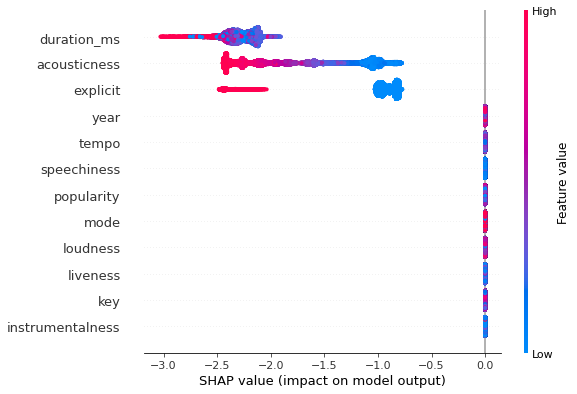

In [14]:
# Feature Importances


# Create shap values and plot them
X_explain = new_X_test.drop(['preds', 'preds_txt', 'year_bin', 'scores', 'decision_fn'], axis=1)
shap_values = shap.TreeExplainer(modobj).shap_values(X_explain)
shap.summary_plot(shap_values, X_explain)

# Analyze Predictions


In [15]:
new_X_test['preds'].value_counts(normalize=True) * 100

 1    99.050478
-1     0.949522
Name: preds, dtype: float64

In [16]:
new_X_train['preds'].value_counts(normalize=True) * 100

 1    98.999462
-1     1.000538
Name: preds, dtype: float64

In [17]:
output_notebook() 
# create a new plot with a title and axis labels
p = figure(title="Training Sample Score", y_axis_label='Anomalousness Score', x_axis_label='Tempo, bpm', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_train['tempo'], 
                                y=new_X_train['scores'], 
                                ur = new_X_train['preds_txt'],
                                legend_group= new_X_train['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_train.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source, fill_alpha=.5, line_alpha = .5)

# show the results
show(p)

Loading BokehJS ...

In [21]:
output_notebook() 
# create a new plot with a title and axis labels
p = figure(title="Test Sample Score", y_axis_label='Anomalousness Score', x_axis_label='Tempo, bpm', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_test['tempo'], 
                                y=new_X_test['scores'], 
                                ur = new_X_test['preds_txt'],
                                legend_group= new_X_test['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_test.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source)

# show the results
show(p)

Loading BokehJS ...

In [18]:
# create a new plot with a title and axis labels
p = figure(title="Test Sample Score", y_axis_label='Anomalousness Score', x_axis_label='Speechiness', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_test['speechiness'], 
                                y=new_X_test['scores'], 
                                ur = new_X_test['preds_txt'],
                                legend_group= new_X_test['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_test.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source)

# show the results
show(p)

In [23]:
features

['acousticness',
 'explicit',
 'duration_ms',
 'instrumentalness',
 'key',
 'liveness',
 'loudness',
 'mode',
 'popularity',
 'speechiness',
 'tempo',
 'year']

## Plot Trees

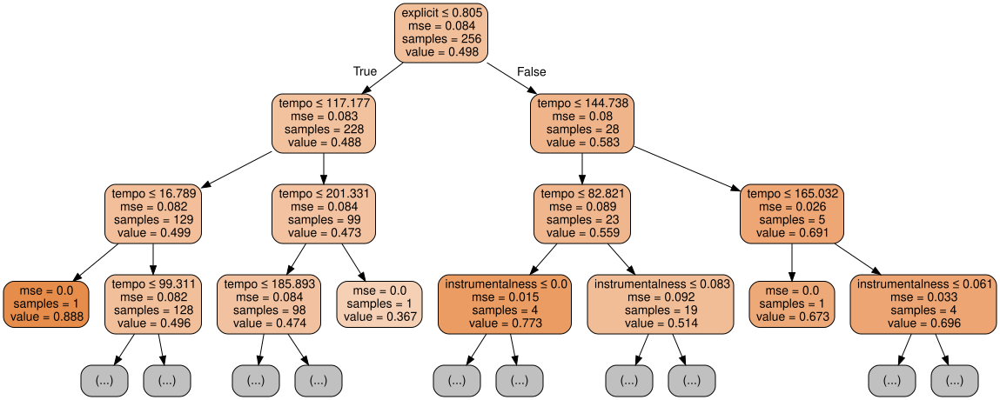

<Figure size 360x360 with 0 Axes>

In [23]:

fig = plt.figure(figsize=(5,5))

fn=new_X_test.columns
cn=new_X_test.preds
fn2 = list(new_X_test.columns[modobj.estimators_features_[3]])

dot_data= tree.export_graphviz(modobj.estimators_[3], 
                     out_file=None, 
                      feature_names=fn2,  
                      class_names=cn,  
                      filled=True, 
                     rounded=True,
                     max_depth=3,
                      special_characters=True)  

graph = graphviz.Source(dot_data)  
graph



# PCA

In [25]:
plotset2 = new_X_test.sample(frac=0.35, replace=False, random_state=1)
plotset2 = plotset2.reset_index()
anoms = plotset2[plotset2['preds_txt'] == 'Anomaly']

In [27]:
outlier_index=list(anoms.index)
pca = PCA(n_components=3)  # Reduce to k=3 dimensions
scaler = StandardScaler()
#normalize the metrics
X = scaler.fit_transform(plotset2[features])
X_reduce = pca.fit_transform(X)

X_reduce2 = pd.DataFrame(X_reduce)
X_reduce2.head()

for i in outlier_index:
    X_reduce2.loc[i, 'outlier_index']= 'Anomaly'
    
values = {'outlier_index': 'Normal'}
X_reduce2b = X_reduce2.fillna(value=values)

X_reduce2b.head()
X_reduce2b['outlier_index'].value_counts()


Normal     17676
Anomaly      165
Name: outlier_index, dtype: int64

In [28]:
X_reduce2 = pd.DataFrame(X_reduce)
X_reduce2.head()

for i in outlier_index:
    X_reduce2.loc[i, 'outlier_index']= 'Anomaly'
    X_reduce2.loc[i, 'outlier_color']= '#ff0000'
    
values = {'outlier_index': 'Normal', 'outlier_color': '#0066ff'}
X_reduce2b = X_reduce2.fillna(value=values)

In [29]:
import plotly.graph_objects as go

x=X_reduce2b[2]
y=X_reduce2b[0]
z=X_reduce2b[1]
col=X_reduce2b['outlier_color']

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,               # set color to an array/list of desired values
        color = np.array(col),
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)])


fig.update_layout(
    autosize=False,
    width=600,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=50,
        t=50,
        pad=1
    ),
)

fig.show()

In [31]:
pd.crosstab(new_X_test['preds_txt'], new_X_test['year_bin'])


year_bin,"(1920.901, 1932.0]","(1932.0, 1943.0]","(1943.0, 1954.0]","(1954.0, 1965.0]","(1965.0, 1976.0]","(1976.0, 1987.0]","(1987.0, 1998.0]","(1998.0, 2009.0]","(2009.0, 2020.0]"
preds_txt,,,,,,,,,
Anomaly,166,140,130,2,5,9,8,5,15
Normal,2026,3181,5716,6629,6578,6645,6555,6545,6618


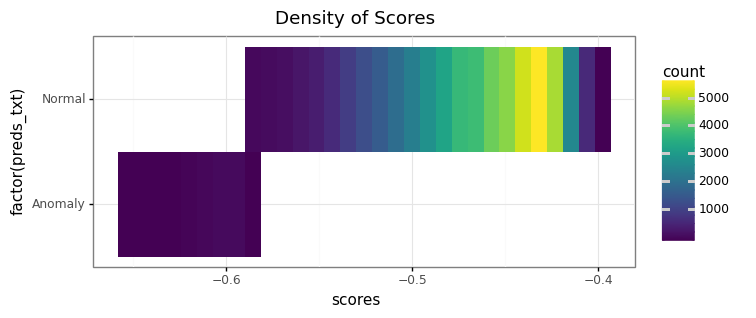

<ggplot: (338155295)>

In [33]:
(
        ggplot(new_X_test, aes(x='scores', y='factor(preds_txt)'))
        + theme_bw()
        + geom_bin2d()
        + labs(title = 'Density of Scores')
    )

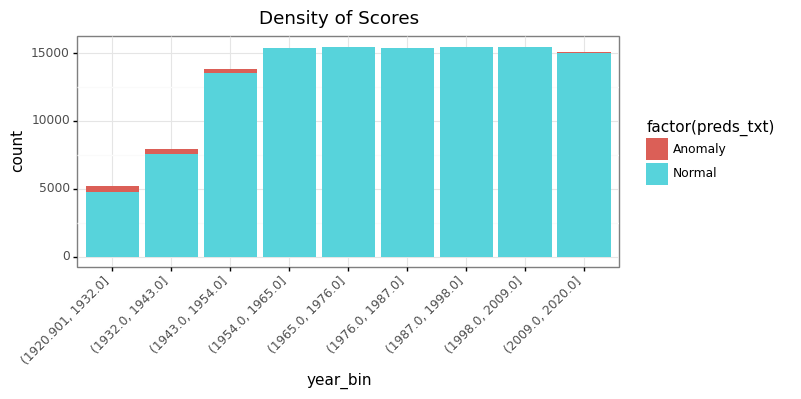

<ggplot: (338156529)>

In [34]:
(
        ggplot(new_X_train, aes(x='year_bin', fill='factor(preds_txt)'))
        + theme_bw()
        +theme(axis_text_x=element_text(rotation=45, hjust=1))
        + geom_bar()
        + labs(title = 'Density of Scores')
    )